In [0]:
import numpy as np
import cv2
from google.colab.patches import cv2_imshow

# termination criteria
criteria = (cv2.TERM_CRITERIA_EPS + cv2.TERM_CRITERIA_MAX_ITER, 30, 0.001)

########################################Blob Detector##############################################

# Setup SimpleBlobDetector parameters.
blobParams = cv2.SimpleBlobDetector_Params()

# Change thresholds
blobParams.minThreshold = 150
blobParams.maxThreshold = 255

# Filter by Area.
blobParams.filterByArea = True
blobParams.minArea = 4500 # 1364   # minArea may be adjusted to suit for your experiment
blobParams.maxArea = 1000000   # maxArea may be adjusted to suit for your experiment

# Filter by Circularity
blobParams.filterByCircularity = True
blobParams.minCircularity = 0.4

# Filter by Convexity
blobParams.filterByConvexity = True
blobParams.minConvexity = 0.87

# Filter by Inertia
blobParams.filterByInertia = True
blobParams.minInertiaRatio = 0.01

# Create a detector with the parameters
blobDetector = cv2.SimpleBlobDetector_create(blobParams)


Фото калибруются плохо - для исправления нужны фото где много точек на краях .

In [0]:
# ! unzip colibration.zip
# ! unzip Archive.zip

In [0]:
# # # ! cd colibration

# from os import listdir
# from os.path import isfile, join
# onlyfiles = [f for f in listdir('colibration') if isfile(join('colibration', f))]
# # onlyfiles 

# for idx, file in enumerate(onlyfiles):
#   print('!mv colibration/' + str(file) + ' colibration/img_' + str(idx + 1) + '.jpg')

In [0]:
# !rm -r colibration
# !rm -r __MACOSX

In [0]:

objp = np.zeros((44, 3), np.float32)
for x in range(0, 11):
  for y in range(0, 4):
    objp[4*x+y] = (x*36, y*72 + (x%2)*36, 0)


In [0]:
objpoints = None # 3d point in real world space
imgpoints = None # 2d points in image plane.
for f in range(1,15):
  # print("%d.jpg" % f)
  img = cv2.imread("%d.jpg" % f)
  gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
  #keypoints = blobDetector.detect(gray)
  #im_with_keypoints = cv2.drawKeypoints(img, keypoints, np.array([]), (0,255,0), cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS)
  ret, corners = cv2.findCirclesGrid(gray, (4,11),
                        flags = cv2.CALIB_CB_ASYMMETRIC_GRID + cv2.CALIB_CB_CLUSTERING,
                                     blobDetector = blobDetector)   # Find the circle grid
  #cv2_imshow(im_with_keypoints)
  #print(keypoints)
  if corners is not None and ret:
    objpoints = np.array([objp]) if objpoints is None else np.append(objpoints, [objp], axis = 0)
    imgpoints = np.array([corners]) if imgpoints is None else np.append(imgpoints, [corners], axis = 0)
  else:
    print("Skip %d.jpg" % f)


print(objpoints.shape)
print(imgpoints.shape)
(i1, i2, i3, i4) = imgpoints.shape;
imgpoints = imgpoints.reshape([i1, i2, i4])
print(imgpoints.shape)
  
ret, mtx, dist, rvecs, tvecs = cv2.calibrateCamera(objpoints, imgpoints, gray.shape[::-1], None, None)

print(mtx)
print(dist)



Skip 1.jpg
Skip 2.jpg
Skip 3.jpg
Skip 4.jpg
Skip 5.jpg
Skip 6.jpg
Skip 7.jpg
Skip 8.jpg
Skip 9.jpg
(5, 44, 3)
(5, 44, 1, 2)
(5, 44, 2)
[[3.20011353e+03 0.00000000e+00 1.50785973e+03]
 [0.00000000e+00 3.22788463e+03 2.06221532e+03]
 [0.00000000e+00 0.00000000e+00 1.00000000e+00]]
[[ 3.26949921e-01 -2.16317760e+00  7.12128021e-03 -2.48407880e-04
   4.49157361e+00]]


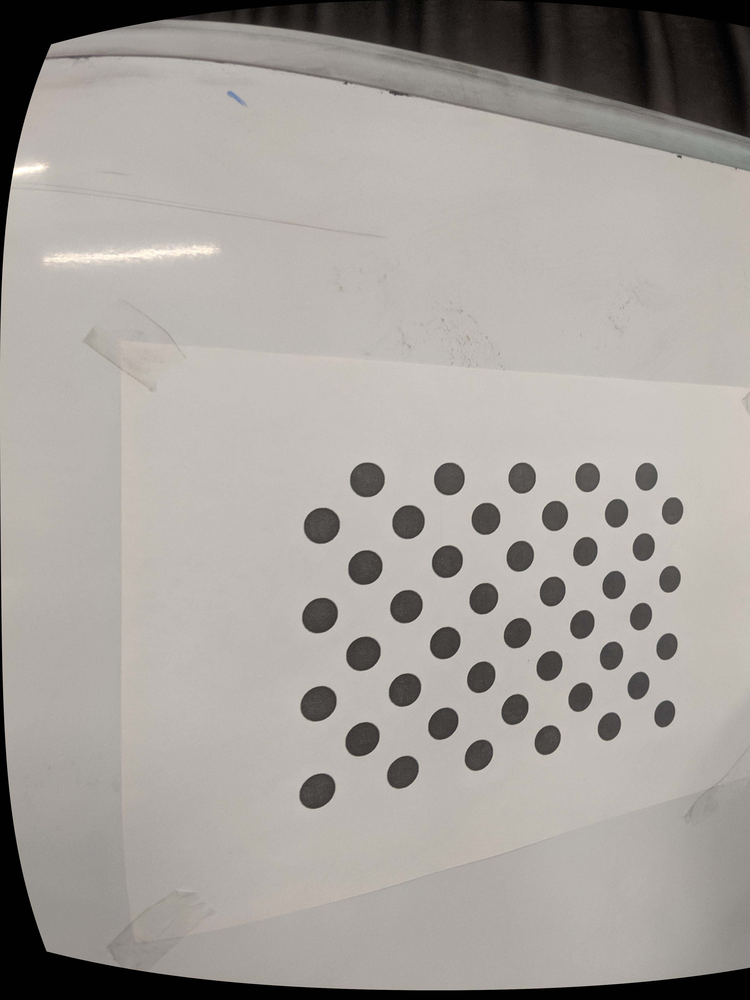

In [0]:
#dist = np.array([0,0,0,0,0])
test = cv2.imread("16.jpg")

(w,h) = test.shape[:2]
newcameramtx, roi=cv2.getOptimalNewCameraMatrix(mtx,dist,(w,h),1,(w,h))
dst = cv2.undistort(test, mtx, dist, None, newcameramtx)
#mapx,mapy = cv2.initUndistortRectifyMap(mtx,dist,None,newcameramtx,(w,h),5)
#dst = cv2.remap(img,mapx,mapy,cv2.INTER_LINEAR)

# crop the image
# x,y,w,h = roi
# dst = dst[y:y+h, x:x+w]
# dst = cv2.resize(dst, (0,0), fx=0.25, fy=0.25) 
cv2_imshow(dst)